# Example of constant size image tiling

Here we use opencv to read image

In [1]:
import os
import sys
import cv2

package_root = os.path.abspath("..")
if package_root not in sys.path:
    sys.path.append(package_root)

In [2]:
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

from mpl_toolkits.axes_grid1 import ImageGrid

In [3]:
image_data = cv2.imread("test_image.jpg")
image_data = cv2.cvtColor(image_data, cv2.COLOR_BGR2RGB)

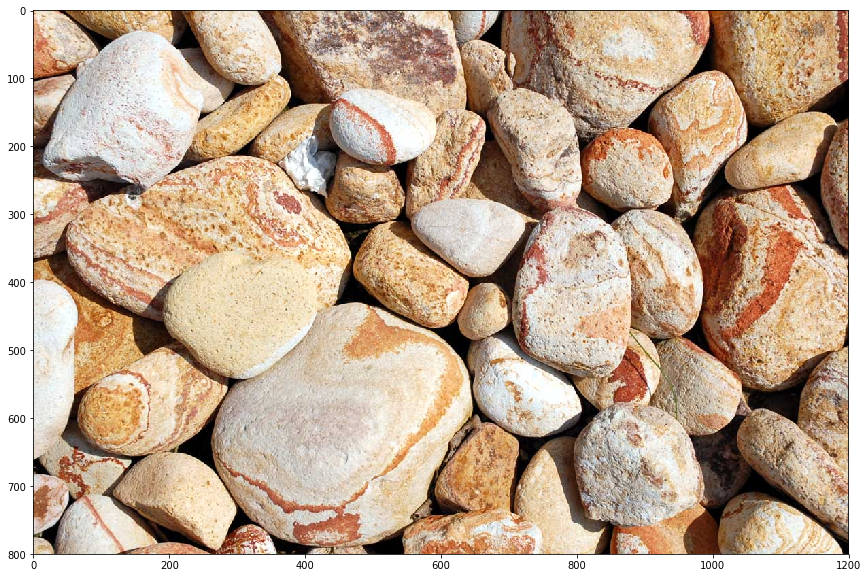

In [14]:
plt.figure(figsize=(20, 10))
plt.imshow(image_data)

In [5]:
from tiling import ConstSizeTiles

Let's define a method to read data from image

In [9]:
def read_data(data, x, y, w, h, out_w, out_h):
    im_h, im_w, im_c = data.shape
    tile = np.zeros((h, w, im_c), dtype=image_data.dtype)
    
    ys = max(y, 0)
    ye = min(y + h, im_h)
    xs = max(x, 0)
    xe = min(x + w, im_w)
    d = data[ys:ye, xs:xe, :]
    
    xs = 0 if x > 0 else -x
    ys = 0 if y > 0 else -y
    d_h, d_w, _ = d.shape
    tile[ys:ys + d_h, xs:xs + d_w, :] = d
    
    out_size = (out_w, out_h)
    if (w, h) != out_size:
        tile = cv2.resize(tile, dsize=out_size)
    
    return tile

## Iterate over input image with constant tile size

Let's iterate over input image with overlapping tiles of size 512x512 with a variable stride.

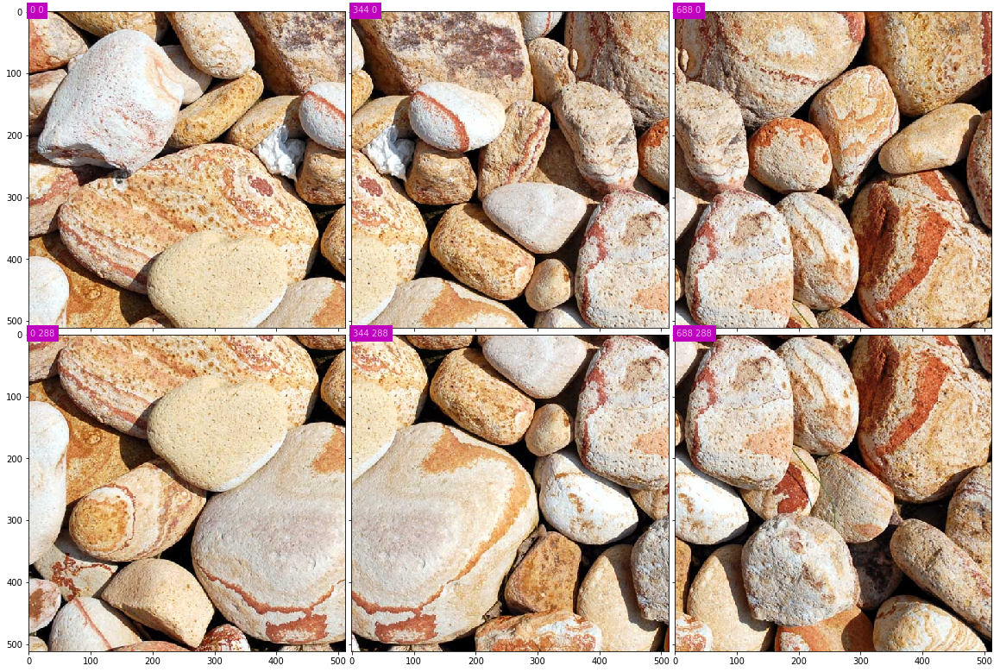

In [12]:
tiles = ConstSizeTiles(image_size=image_data.shape[:2][::-1], tile_size=512, min_overlapping=15, scale=1.0)

fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111, nrows_ncols=(tiles.ny, tiles.nx), axes_pad=0.1)

for i, extent in enumerate(tiles):
    x, y, w, h = extent
    tile = read_data(image_data, x, y, w, h, tiles.tile_size[0], tiles.tile_size[1])
    ax = grid[i]
    im = ax.imshow(tile)
    ax.text(2, 2, '%i %i' % (x, y), color='w', backgroundcolor='m', alpha=0.7)
    ax.axis('on')

### Tiles with scale

Let's iterate over the input image with tiles of size 320x320 and scale of 0.75 (we zoom out the image)

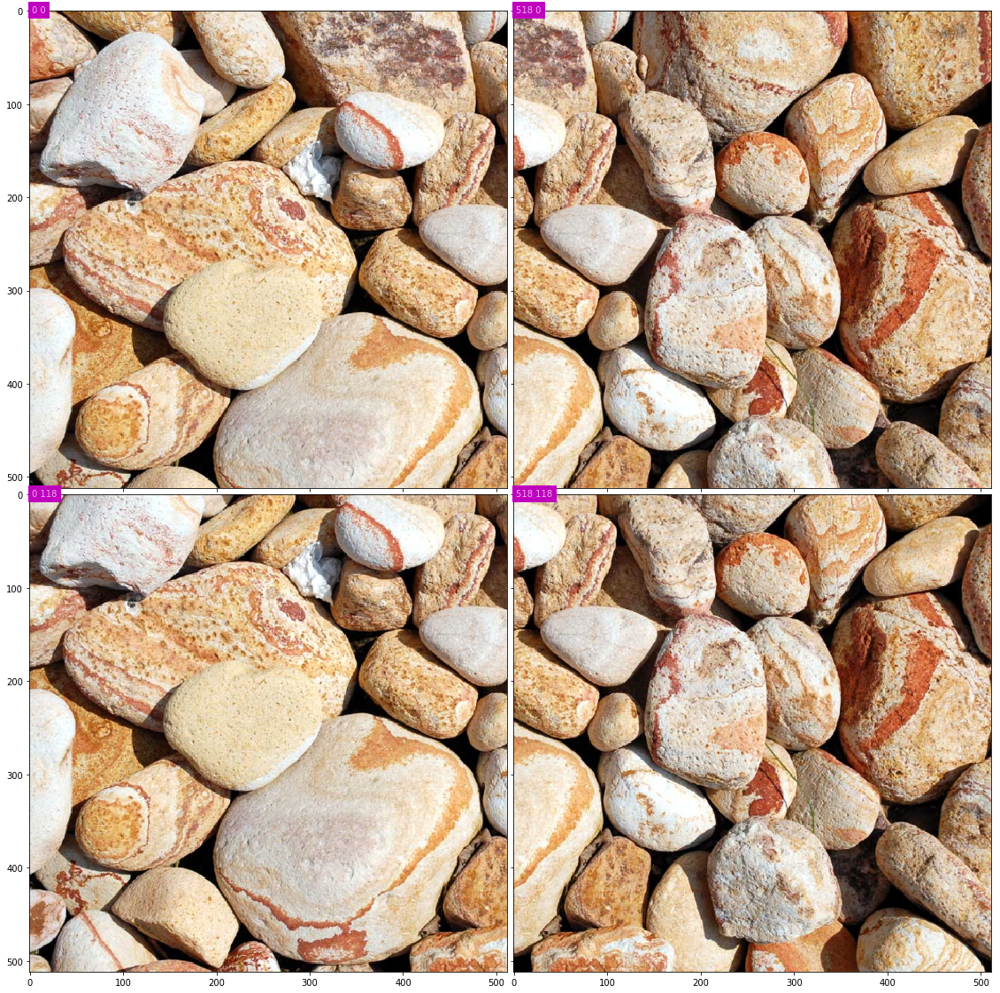

In [15]:
tiles = ConstSizeTiles(image_size=image_data.shape[:2][::-1], tile_size=512, min_overlapping=15, scale=0.75)

fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111, nrows_ncols=(tiles.ny, tiles.nx), axes_pad=0.1)

for i, extent in enumerate(tiles):
    x, y, w, h = extent
    tile = read_data(image_data, x, y, w, h, tiles.tile_size[0], tiles.tile_size[1])
    ax = grid[i]
    im = ax.imshow(tile)
    ax.text(2, 2, '%i %i' % (x, y), color='w', backgroundcolor='m', alpha=0.7)
    ax.axis('on')

Let's zoom in

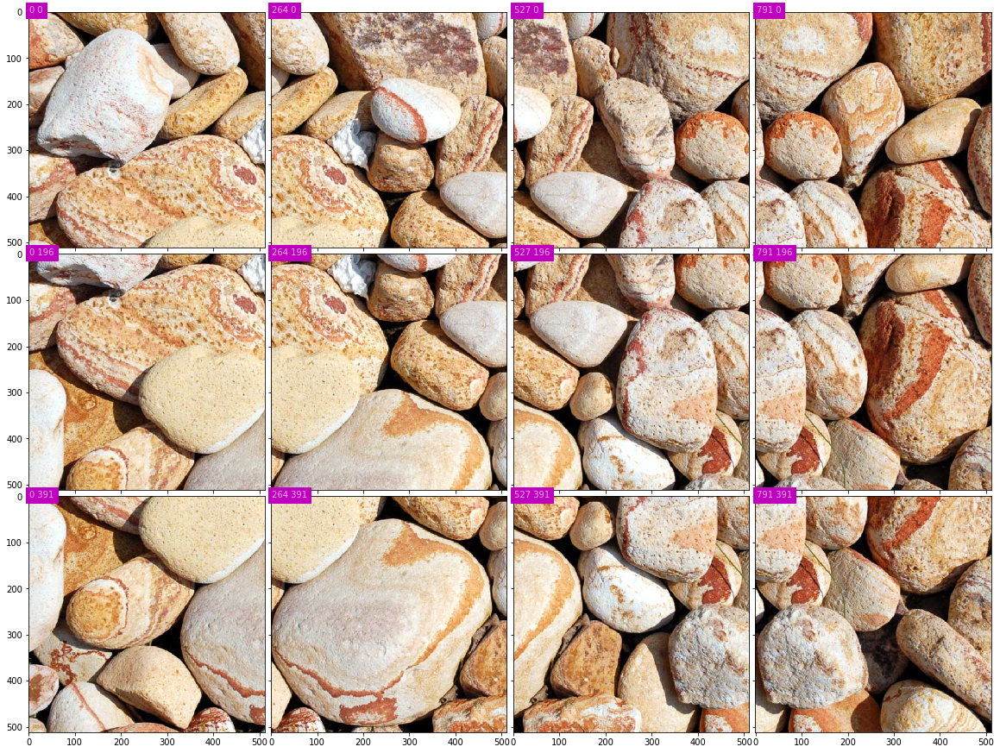

In [16]:
tiles = ConstSizeTiles(image_size=image_data.shape[:2][::-1], tile_size=512, min_overlapping=15, scale=1.25)

fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111, nrows_ncols=(tiles.ny, tiles.nx), axes_pad=0.1)

for i, extent in enumerate(tiles):
    x, y, w, h = extent
    tile = read_data(image_data, x, y, w, h, tiles.tile_size[0], tiles.tile_size[1])
    ax = grid[i]
    im = ax.imshow(tile)
    ax.text(2, 2, '%i %i' % (x, y), color='w', backgroundcolor='m', alpha=0.7)
    ax.axis('on')